# Multiple linear regression


In [1]:
# Step 1: Import all packages and libraries in Python that need for this project
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
import seaborn as sns
from scipy import stats
# Theses are packages and libraries that for map visualization
import folium
from folium.plugins import HeatMap
from folium.plugins import FloatImage
sns.set()

In [2]:
# Bước 2: Nhập dữ liệu đầu vào
#ex1 = 'ex1.xlsx' 
#data = pd.read_excel(ex1, index_col=0)
#print(data.head()) # print the first 5 rows
data = pd.read_csv("house_price.csv")
data.sample(70)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8273,5309100450,20150330T000000,546500.0,3,2.50,1410,2675,1.0,0,0,...,7,820,590,1985,0,98117,47.6786,-122.371,1410,4013
7904,3750605620,20150324T000000,225000.0,3,1.75,1580,14400,1.0,0,0,...,7,1580,0,1981,0,98001,47.2598,-122.281,1480,9600
19867,982850060,20140603T000000,400000.0,3,2.25,1450,4706,2.0,0,0,...,7,1450,0,2009,0,98028,47.7610,-122.232,1490,4667
12947,7905400040,20140711T000000,206000.0,3,1.75,1140,9800,1.0,0,0,...,7,1140,0,1968,0,98001,47.3063,-122.270,1370,9800
17865,162500015,20141020T000000,362500.0,5,2.00,2330,8586,1.0,0,0,...,7,1270,1060,1961,0,98133,47.7671,-122.334,1550,8287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20475,9268851800,20140505T000000,415000.0,3,2.25,1620,998,2.5,0,0,...,8,1540,80,2010,0,98027,47.5401,-122.027,1620,1299
18318,2421059125,20150414T000000,579950.0,4,2.50,2880,213444,1.0,0,0,...,8,2140,740,1984,0,98092,47.2887,-122.109,2810,213444
13159,2473100330,20140923T000000,252500.0,2,1.50,1280,8710,1.0,0,0,...,7,1280,0,1967,0,98058,47.4472,-122.160,1520,9375
7288,9195700380,20140811T000000,620000.0,4,2.25,1530,7845,1.0,0,0,...,7,1030,500,1981,0,98027,47.5589,-122.082,1710,7627


In [4]:
price_corr = data.corr()['price'].sort_values(ascending=False)
print(price_corr)

price            1.000000
sqft_living      0.702035
grade            0.667434
sqft_above       0.605567
sqft_living15    0.585379
bathrooms        0.525138
view             0.397293
sqft_basement    0.323816
bedrooms         0.308350
lat              0.307003
waterfront       0.266369
floors           0.256794
yr_renovated     0.126434
sqft_lot         0.089661
sqft_lot15       0.082447
yr_built         0.054012
condition        0.036362
long             0.021626
id              -0.016762
zipcode         -0.053203
Name: price, dtype: float64


In [3]:
# Bước 3: Mô tả thông tin
data.head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
data.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,20141015T000000,325000.0,2,0.75,1020,1076,2.0,0,0,...,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [5]:
data.shape

(21613, 21)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [7]:
data.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [8]:
# Mô tả thống kê
#data.describe() is used to view some basic statistical details like percentile, mean, std etc. 
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


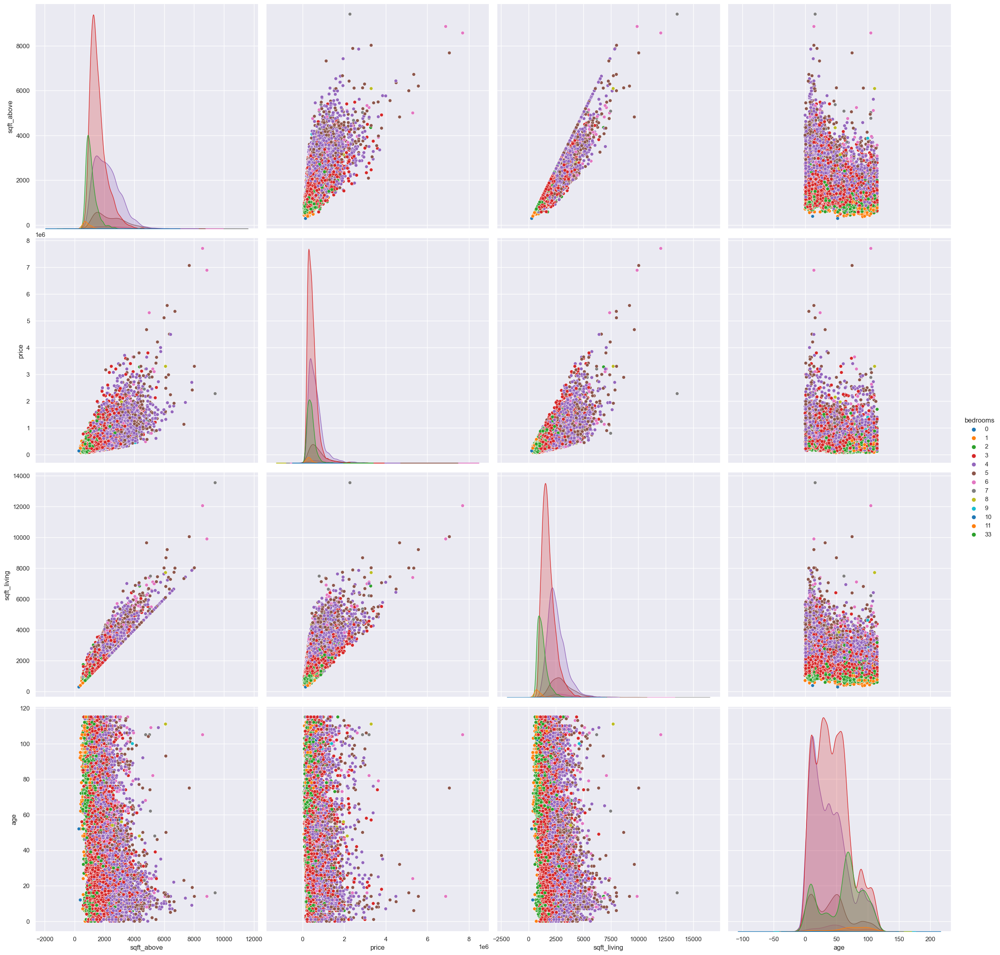

In [6]:
data['age']=2015-data['yr_built']
g = sns.pairplot(data[['sqft_above','price','sqft_living','bedrooms', 'age']], 
                 hue='bedrooms', palette='tab10',height=6,)


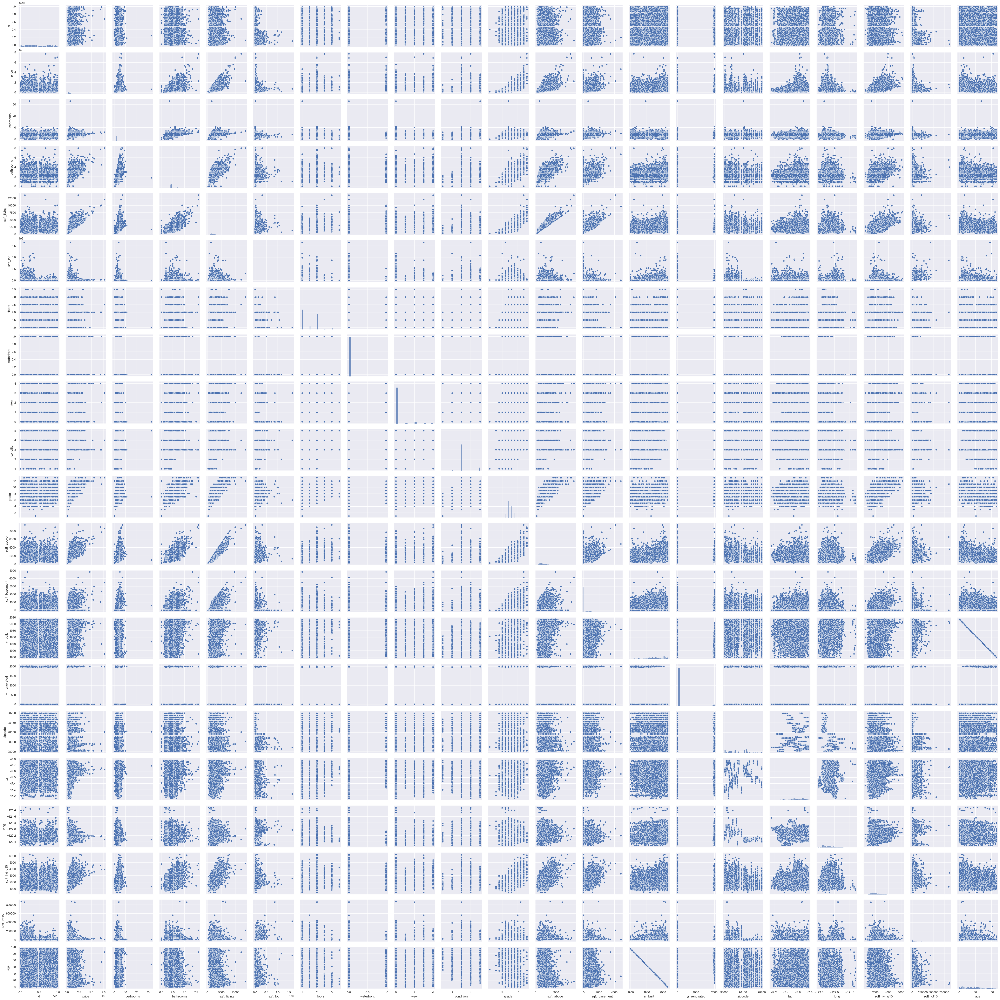

In [8]:
# A pairplot plot a pairwise relationships in a dataset.
sns.pairplot(data)

In [11]:
# data.corr() is used to find the pairwise correlation of all columns in the dataframe.
data.corr()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406


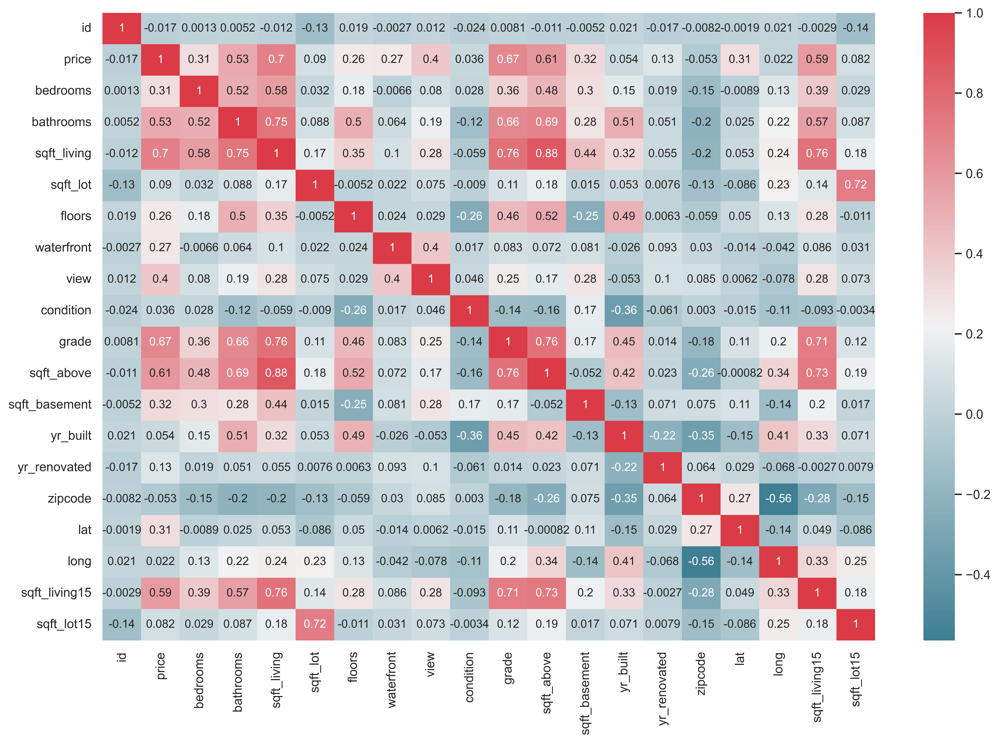

In [5]:
def correlation_heatmap(df1):
    _, ax = plt.subplots(figsize = (15, 10), dpi = 600)
    colormap= sns.diverging_palette(220, 10, as_cmap = True)
    sns.heatmap(data.corr(), annot=True, cmap = colormap)

correlation_heatmap(data) 

In [5]:
#  is a plot of rectangular data as a color-encoded matrix for corr() function
plt.subplots(figsize=(15,15), dpi = 600)
sns.heatmap(data.corr(), annot=True)

<AxesSubplot:>

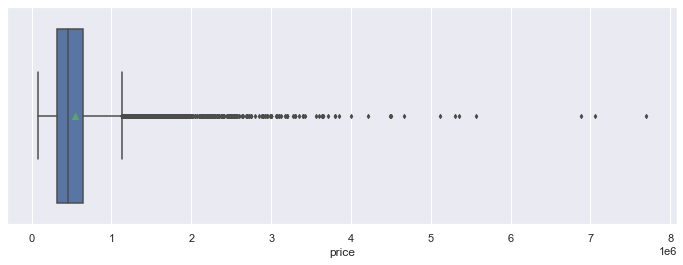

In [13]:
# boxplot is a method for graphically depicting groups of numerical data through their quartiles
fig, ax = plt.subplots(figsize=(12,4))
sns.boxplot(x = 'price', data = data, orient = 'h', width = 0.8, 
                 fliersize = 3, showmeans=True, ax = ax)
plt.show()

<AxesSubplot:xlabel='waterfront', ylabel='price'>

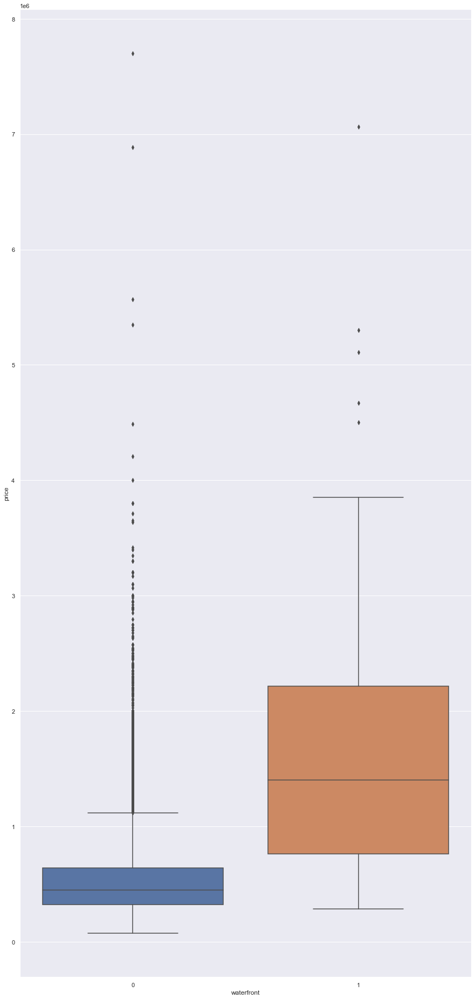

In [8]:
sns.boxplot(x= "waterfront", y= "price", data = data)

In [5]:
# Bước 4: Phân tích hồi qui
#phase 1: define the dependent variable and independent variables
y = data['price']
features =["floors", "waterfront","lat" ,"bedrooms" ,"sqft_basement" ,"view" ,"bathrooms","sqft_living15","sqft_above","grade","sqft_living"]

In [6]:
#phase 2: add constant
x1 = data[features]
x = sm.add_constant(x1)
x.head()

,const,floors,waterfront,lat,bedrooms,sqft_basement,view,bathrooms,sqft_living15,sqft_above,grade,sqft_living
0,1.0,1.0,0,47.5112,3,0,0,1.00,1340,1180,7,1180
1,1.0,2.0,0,47.7210,3,400,0,2.25,1690,2170,7,2570
2,1.0,1.0,0,47.7379,2,0,0,1.00,2720,770,6,770
3,1.0,1.0,0,47.5208,4,910,0,3.00,1360,1050,7,1960
4,1.0,1.0,0,47.6168,3,0,0,2.00,1800,1680,8,1680


In [16]:
from notebook.services.config import ConfigManager
cm = ConfigManager().update('notebook', {'limit_output': 3000})
#phase 3: OLS
results = sm.OLS(y,x).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.658
Method:                 Least Squares   F-statistic:                     4151.
Date:                Mon, 13 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:21:13   Log-Likelihood:            -2.9602e+05
No. Observations:               21613   AIC:                         5.921e+05
Df Residuals:                   21602   BIC:                         5.921e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -3.239e+07   5.12e+05    -63.272

In [18]:
# Bước 5: Vẽ phương trình dự báo cho một biến
#phase 1: define the dependent variable and independent variables
y = data['price']
f =["sqft_living"]

#phase 2: add constant
x2 = data[f]

x3 = sm.add_constant(x2)
x3.head()

,const,sqft_living
0,1.0,1180
1,1.0,2570
2,1.0,770
3,1.0,1960
4,1.0,1680


In [13]:
#phase 3: OLS
results = sm.OLS(y,x3).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.493
Method:                 Least Squares   F-statistic:                 2.100e+04
Date:                Sat, 04 Jun 2022   Prob (F-statistic):               0.00
Time:                        12:12:16   Log-Likelihood:            -3.0027e+05
No. Observations:               21613   AIC:                         6.005e+05
Df Residuals:                   21611   BIC:                         6.006e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -4.358e+04   4402.690     -9.899      0.000   -5.22e+04    -3.5e+04
sqft_living   280.6236      1.936    144.920      0.000     276.828     284.419
==============================================================================
Omnibus:                    14832.490   Durbin-Watson:                   1.983
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           546444.713
Skew:                           2.824   Prob(JB):                         0.00
Kurtosis:                      26.977   Cond. No.                     5.63e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.63e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

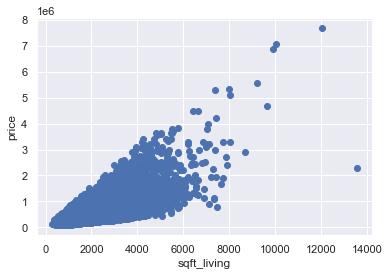

In [12]:
#phase 3: explore data
plt.scatter(x2,y)
plt.xlabel('sqft_living')
plt.ylabel('price')
plt.show()

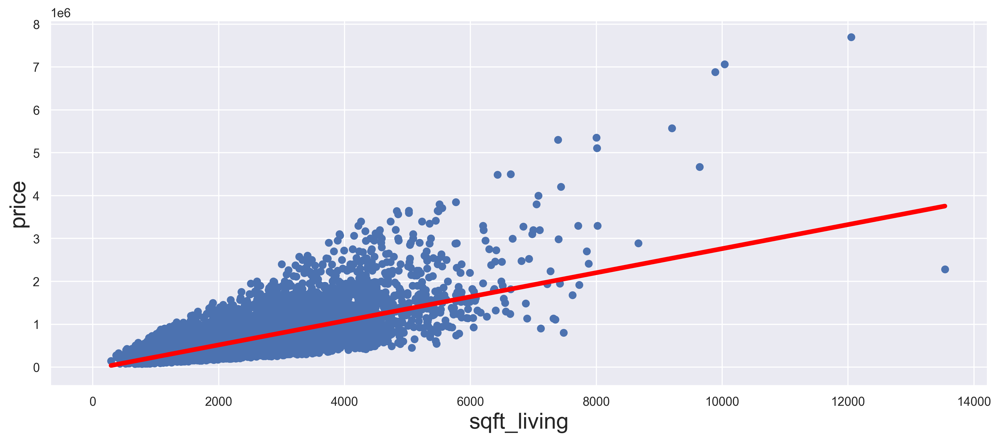

In [11]:
# Bước 5: Vẽ phương trình dự báo cho một biến
#phase 1: define the dependent variable and independent variables
y = data['price']
f =["sqft_living"]

#phase 2: add constant
x2 = data[f]

x3 = sm.add_constant(x2)
x3.head()
#phase 4: plot and present linear equation
plt.figure(figsize=(15,6), dpi=300)
plt.scatter(x2,y)
yhat =  280.6236*x3 - 4.358e+04
fig = plt.plot(x3, yhat, lw=4, c='red', label='regression line')
plt.xlabel('sqft_living', fontsize = 20)
plt.ylabel('price', fontsize = 20)
plt.show()

In [4]:
# Bước 1: Nhập thư viện và các gói cần dùng cho phân tích hồi qui đa biến
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
import seaborn as sns
from folium.plugins import HeatMap
sns.set()
data = pd.read_csv("house_price.csv")
# Obtaining the mean price for all zipcodes
zipinfo=data.groupby('zipcode')['price'].mean()
zipinfo=pd.DataFrame(zipinfo)
zipinfo.reset_index(inplace=True)

# Obtaining one of the latitude and longitude values corresponding to the zipcodes
latitude=[]
longitude=[]
for zipc in zipinfo['zipcode']:
    lt=data.loc[data['zipcode']==zipc,'lat']
    latitude.append(lt.iloc[0])
    lg=data.loc[data['zipcode']==zipc,'long']
    longitude.append(lg.iloc[0])

zipinfo['lat']=latitude
zipinfo['long']=longitude
# Plotting the mean price for each zipcode using the zipinfo dataframe in the map
import folium
data['price']=data['price'].astype('str')
location = data['lat'].mean(), data['long'].mean()

locationlist = zipinfo[['lat','long']].values.tolist()
zips=zipinfo['zipcode'].values.tolist()
labels = data['price'].values.tolist()

# Empty map
map1 = folium.Map(location=location, zoom_start=14)

# Accesing the latitude
for point in range(1,len(zipinfo.index)): 
    popup = folium.Popup('Price : {} , Zipcode : {}'.format(labels[point],zips[point]), parse_html=True)
    folium.Marker(locationlist[point], popup=popup).add_to(map1)

map1

# Click the marker to view price and zipcode information

In [8]:


# Bước 1: Nhập thư viện và các gói cần dùng cho phân tích hồi qui đa biến
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
import folium
from folium.plugins import HeatMap
from folium.plugins import FloatImage
import seaborn as sns
sns.set()
data = pd.read_csv("house_price.csv")
# Obtaining the mean price for all zipcodes
zipinfo=data.groupby('zipcode')['price'].mean()
zipinfo=pd.DataFrame(zipinfo)
zipinfo.reset_index(inplace=True)
# find the row of the house which has the highest price
maxpr= data.loc[data['price'].idxmax()]
minpr=data.loc[data['price'].idxmin()]

# define a function to draw a basemap easily
def generateBaseMap(default_location=[47.5112, -122.257], default_zoom_start=9.4):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

data_copy = data.copy()
# select a zipcode for the heatmap
#set(data['zipcode'])
#data_copy = data[data['zipcode']==98001].copy()
data_copy['count'] = 1
basemap = generateBaseMap()
# add carton position map
folium.TileLayer('cartodbpositron').add_to(basemap)
s=folium.FeatureGroup(name='icon').add_to(basemap)
# add a marker for the house which has the highest price
folium.Marker([maxpr['lat'], maxpr['long']],popup='Highest Price: $'+str(format(maxpr['price'],'.0f')),
              icon=folium.Icon(color='green')).add_to(s)
folium.Marker([minpr['lat'], maxpr['long']],popup='Lowest Price: $'+str(format(minpr['price'],'.0f')),
              icon=folium.Icon(color='green')).add_to(s)
# add heatmap
heatmap_data = data.groupby(['lat', 'long']).price.mean().reset_index().values
HeatMap(
    heatmap_data, 
    name='Price', radius=25, max_zoom=18, min_opacity=0.3
).add_to(folium.FeatureGroup(name='Heat Map').add_to(basemap))
folium.LayerControl(collapsed=False).add_to(basemap)
basemap

In [63]:
#add heatmao scall to map 
from folium.plugins import FloatImage
mymap = folium.Map(location= [47.56 , -122.22], zoom_start =9) 

# Get the highest average house price
maxave = int(data.groupby(['zipcode']).mean()['price'].max())
print("Highest City House Price is: ", maxave)

# Create a color map to match house prices. White - low price, Black - high price
colormap = ['#00009B' ,'#0099FF' ,'#63FF9B' ,'#FFFB00' ,'#FF2F00' , '#8B0000']

# Add marker info 

for index, row in data.groupby('zipcode').agg({'lat': 'mean','long': 'mean', 'price':'mean', 'zipcode':'count' }).iterrows(): 
    # Set icon color based on price 
    theCol = colormap[ int((len(colormap) - 1 ) *  float( row['price']) / maxave) ]
    markerText =  ( 'Average price : ' + str(round(row['price'], 2) ) +' $' + '\n' + 'Houses sold : ' + str(row['zipcode']) )
    folium.CircleMarker( radius=(row['zipcode'])/15, location=[row['lat'],row['long']], popup=folium.Popup(markerText,max_width=150,min_width=150), color= theCol,fill=True,fill_color=theCol,  ).add_to(mymap)

FloatImage('https://lh3.googleusercontent.com/proxy/SRXTqZngcyOscx1nR1iB9c4IobPtOn0cEROsZ_wK6CO3nfAjD4e4TDXPDjN3AU2ZLJxzJQaoLJnlqk9zZevN7S2wZZctQysIIKOvigpGatc', bottom=0, left=65).add_to(mymap)
mymap

Highest City House Price is:  2160606


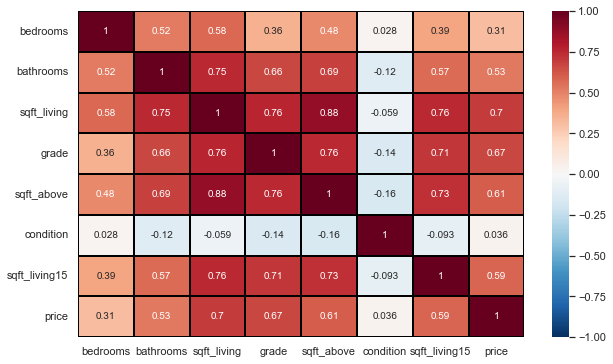

In [1]:
# Bước 1: Nhập thư viện và các gói cần dùng cho phân tích hồi qui đa biến
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
import seaborn as sns
sns.set()
data = pd.read_csv("house_price.csv")
cols = data[['bedrooms', 'bathrooms', 'sqft_living', 'grade', 'sqft_above','condition',
             'sqft_living15', 'price']]
most_corr_var = cols.corr()

plt.figure(figsize=[10, 6])
sns.heatmap(data=most_corr_var, vmin=-1, vmax=1, linewidth=0.01,
            linecolor='black', cmap='RdBu_r', annot=True)

plt.show()

c:\Users\ADMIN\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


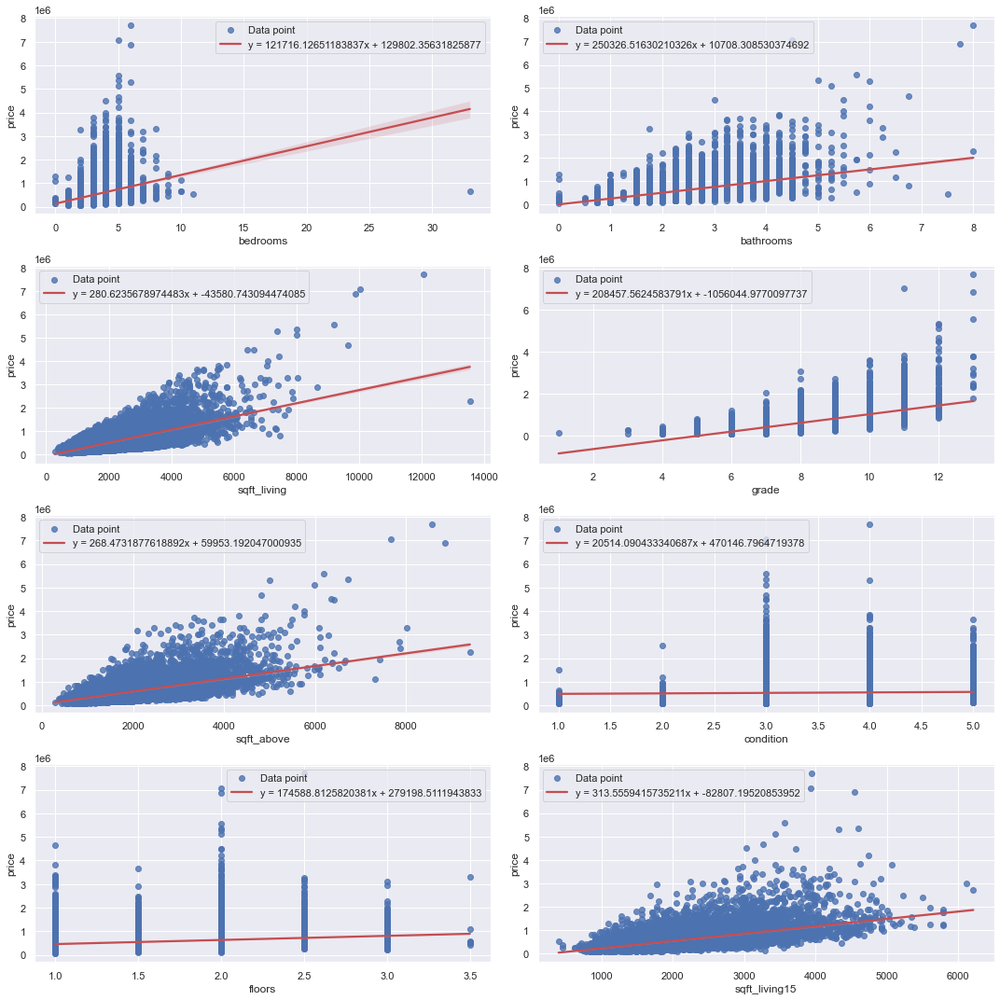

In [1]:
# Step 1: Import all packages and libraries in Python that need for this project
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
import seaborn as sns
from scipy import stats
sns.set()
data = pd.read_csv("house_price.csv")
cols = data[['bedrooms', 'bathrooms', 'sqft_living', 'grade', 'sqft_above','condition','floors',
             'sqft_living15', 'price']]
most_corr_var = cols.corr()
plt.figure(figsize=[15, 15])

i = 1

for col in cols:
    if col == 'price':
        continue
    plt.subplot(4, 2, i)
    plt.xlabel(col)
    plt.ylabel('Price ($)')
    #find sum(x) , sum(y) , sum (xy), sum(x*x) sum(y*y)
    sum_x = np.sum(data[col])
    sum_y = np.sum( data['price'])
    sum_xy = np.sum(np.multiply(data[col], data['price']))
    sum_xx = np.sum(np.multiply(data[col], data[col]))
    sum_yy = np.sum(np.multiply( data['price'], data['price']))

    #print sum_x, sum_y,sum_xx, sum_xy, sum_yy

    # find the intercept values in the slope equation (Y = A + BX)
    number_of_records = len(data[col])
    A = (sum_y*sum_xx - sum_x*sum_xy)/(number_of_records*sum_xx - sum_x*sum_x)
    B = (number_of_records*sum_xy - sum_x*sum_y)/(number_of_records*sum_xx - sum_x*sum_x)
    # plt.title(f' Equation Y = {round(A, 2)} +{round(B, 2)}X describe association between {col} vs price')
    # get coeffs of linear fit
    slope, intercept, r_value, p_value, std_err = stats.linregress(data[col],data['price'])
    sns.regplot(data[col], data['price'], line_kws={'color': 'r'})
    plt.legend(labels=["Data point",f"y = {B}x + {A}"])
    i+=1
    

plt.tight_layout()
plt.show()

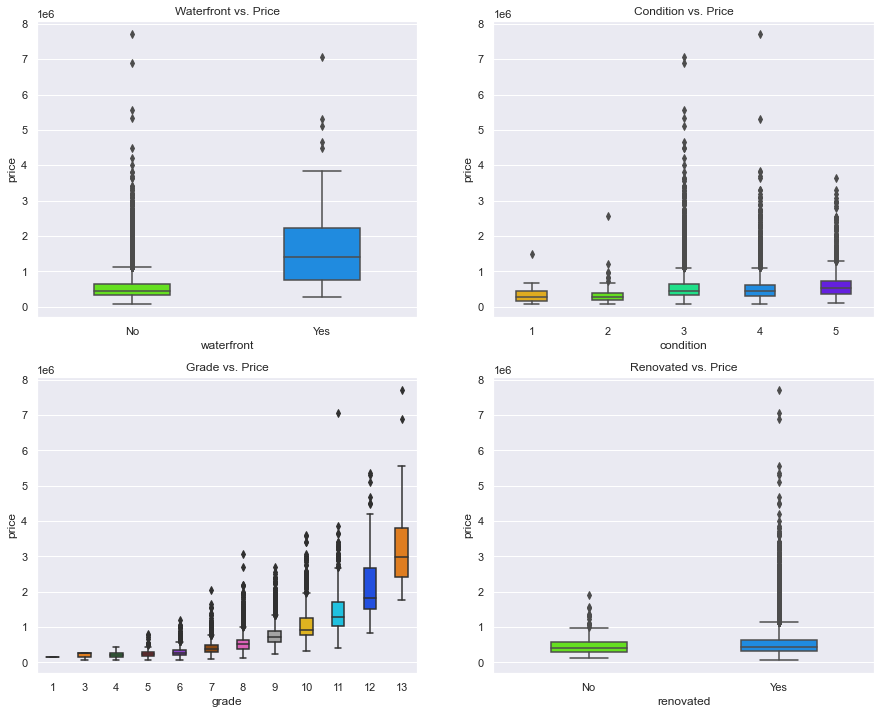

In [23]:
fig=plt.figure()

sns.set(rc={'figure.figsize':(15,12)})

ax0=fig.add_subplot(2,2,1)
sns.boxplot(x="waterfront", y="price", data=data,dodge=False,palette="gist_rainbow",width=0.4,ax=ax0)
ax0.set_xticklabels(['No','Yes'])
ax0.set_title('Waterfront vs. Price')

ax1=fig.add_subplot(2,2,2)
sns.boxplot(x="condition", y="price", data=data,dodge=False,palette="gist_rainbow",width=0.4,ax=ax1)
ax1.set_title('Condition vs. Price')

ax2=fig.add_subplot(2,2,3)
sns.boxplot(x="grade", y="price", data=data,dodge=False,palette="bright",width=0.4,ax=ax2)
ax2.set_title('Grade vs. Price')

ax3=fig.add_subplot(2,2,4)
sns.boxplot(x="renovated", y="price", data=data,dodge=False,palette="gist_rainbow",width=0.4,ax=ax3)
ax3.set_xticklabels(['No','Yes'])
ax3.set_title('Renovated vs. Price')
plt.show()


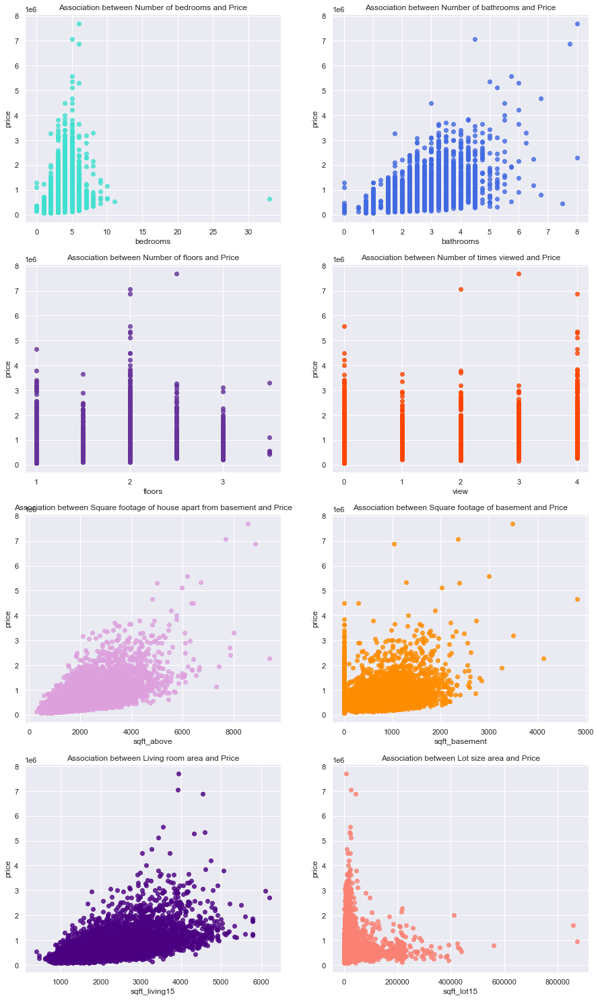

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
import seaborn as sns
sns.set()
data = pd.read_csv("house_price.csv")
fig1=plt.figure()

sns.set(rc={'figure.figsize':(15,33)})

ax01=fig1.add_subplot(5,2,1)
sns.regplot(x='bedrooms', y='price', data=data,fit_reg=False,ax=ax01,color='turquoise')
ax01.set_title('Association between Number of bedrooms and Price')

ax11=fig1.add_subplot(5,2,2)
sns.regplot(x='bathrooms', y='price', data=data,fit_reg=False,ax=ax11,color='royalblue')
ax11.set_title('Association between Number of bathrooms and Price')

ax21=fig1.add_subplot(5,2,3)
sns.regplot(x='floors', y='price', data=data,fit_reg=False,ax=ax21,color='rebeccapurple')
ax21.set_xticks([1,2,3])
ax21.set_title('Association between Number of floors and Price')

ax31=fig1.add_subplot(5,2,4)
sns.regplot(x='view', y='price', data=data,fit_reg=False,ax=ax31,color='orangered')
ax31.set_xticks([0,1,2,3,4])
ax31.set_title('Association between Number of times viewed and Price')

ax41=fig1.add_subplot(5,2,5)
sns.regplot(x='sqft_above', y='price', data=data,fit_reg=False,ax=ax41,color='plum')
ax41.set_title('Association between Square footage of house apart from basement and Price')

ax51=fig1.add_subplot(5,2,6)
sns.regplot(x='sqft_basement', y='price', data=data,fit_reg=False,ax=ax51,color='darkorange')
ax51.set_title('Association between Square footage of basement and Price')

ax61=fig1.add_subplot(5,2,7)
sns.regplot(x='sqft_living15', y='price', data=data,fit_reg=False,ax=ax61,color='indigo')
ax61.set_title('Association between Living room area and Price')

ax71=fig1.add_subplot(5,2,8)
sns.regplot(x='sqft_lot15', y='price', data=data,fit_reg=False,ax=ax71,color='salmon')
ax71.set_title('Association between Lot size area and Price')


plt.show()

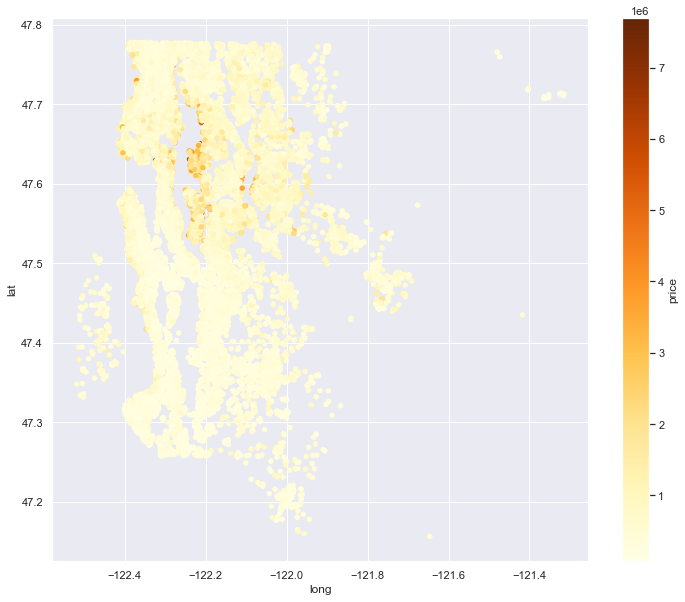

In [31]:
# Visualizing 'lat' and 'long' with a scatter plot

data.plot(kind="scatter", x="long", y="lat", figsize=(12, 10), c="price", 
             cmap="YlOrBr", colorbar=True, sharex=False)
plt.show()

[Text(0.5, 0, 'Month'), Text(0, 0.5, 'Price'), Text(0.5, 1.0, 'Price Trends')]

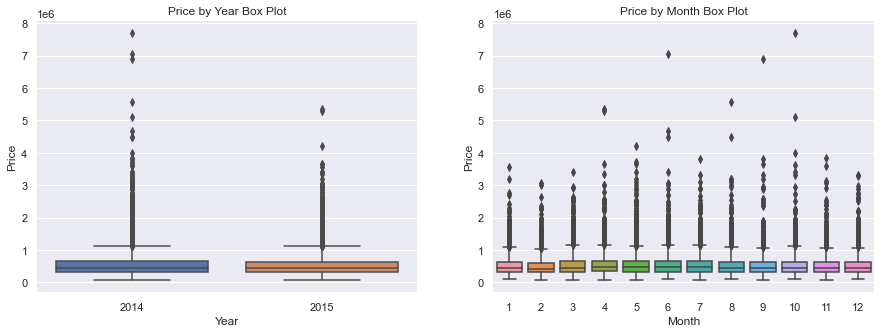

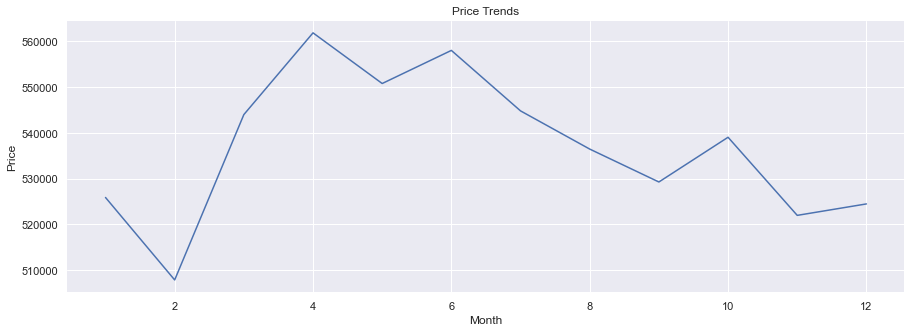

In [9]:
data['date'] = pd.to_datetime(data['date'])

data['month'] = data['date'].apply(lambda date:date.month)
data['year'] = data['date'].apply(lambda date:date.year)
f, axes = plt.subplots(1, 2,figsize=(15,5))
sns.boxplot(x='year',y='price',data=data, ax=axes[0])
sns.boxplot(x='month',y='price',data=data, ax=axes[1])
sns.despine(left=True, bottom=True)
axes[0].set(xlabel='Year', ylabel='Price', title='Price by Year Box Plot')
axes[1].set(xlabel='Month', ylabel='Price', title='Price by Month Box Plot')

f, axe = plt.subplots(1, 1,figsize=(15,5))
data.groupby('month').mean()['price'].plot()
sns.despine(left=True, bottom=True)
axe.set(xlabel='Month', ylabel='Price', title='Price Trends')

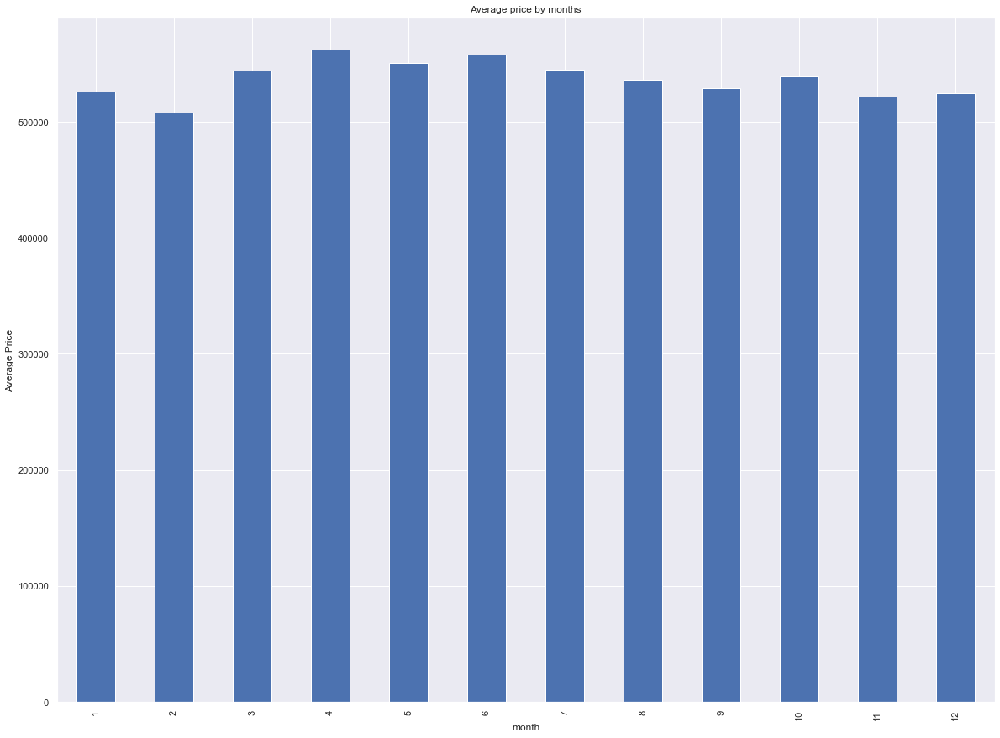

In [10]:
# Visualizing average price by months
fig, ax = plt.subplots(figsize=(20,15))
data.groupby('month')['price'].mean().plot.bar()
plt.title('Average price by months')
plt.ylabel('Average Price')
plt.show()

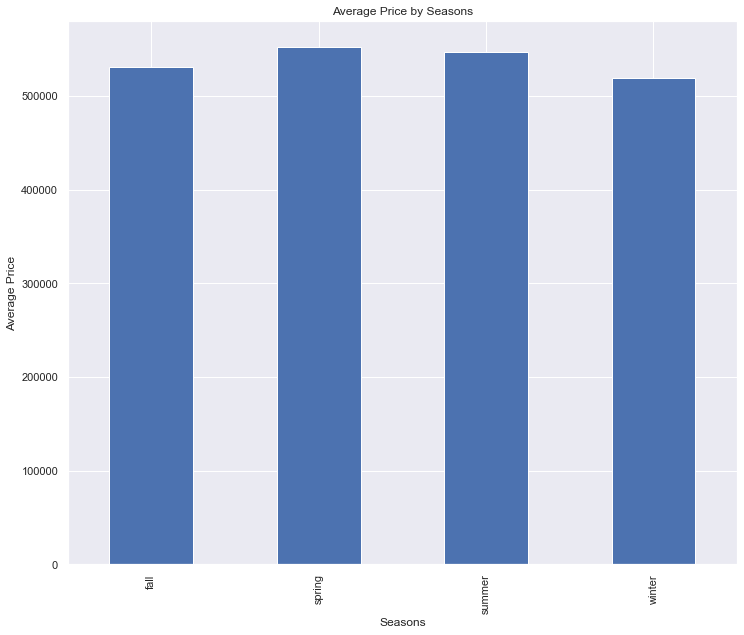

In [12]:
# Create new 'season' column 
season = {
    1: 'winter',
    2: 'winter',
    3: 'spring',
    4: 'spring',
    5: 'spring',
    6: 'summer',
    7: 'summer',
    8: 'summer',
    9: 'fall',
    10: 'fall',
    11: 'fall',
    12: 'winter',
}
data['season'] = data['month'].replace(season)
data[['month', 'season']][:10]
#average price by seasons
fig, ax = plt.subplots(figsize=(12,10))
data.groupby('season')['price'].mean().plot.bar()
plt.xlabel('Seasons')
plt.ylabel('Average Price')

plt.title('Average Price by Seasons')
plt.show()